## Machine Learning Task

In [46]:
%matplotlib inline

##### The focal point of this study is to investigate the relationship between a range of explanatory variables and house prices in California and to predict the housing prices using suitable machine learning. 

In [47]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.datasets import fetch_california_housing
from sklearn.metrics import mean_squared_error, r2_score
import seaborn as sns

In [48]:
# importing house prices dataset
cal_housing = fetch_california_housing()
X = pd.DataFrame(cal_housing.data, columns=cal_housing.feature_names)
y = cal_housing.target

In [49]:
data_housing = pd.DataFrame(
    cal_housing.data,
    columns = cal_housing['feature_names']
)
data_housing['PRICE'] = cal_housing.target
data_housing.head() # visualising the first records of the data frame

,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,Latitude,Longitude,PRICE
0,8.3252,41.0,6.984127,1.023810,322.0,2.555556,37.88,-122.23,4.526
1,8.3014,21.0,6.238137,0.971880,2401.0,2.109842,37.86,-122.22,3.585
2,7.2574,52.0,8.288136,1.073446,496.0,2.802260,37.85,-122.24,3.521
3,5.6431,52.0,5.817352,1.073059,558.0,2.547945,37.85,-122.25,3.413
4,3.8462,52.0,6.281853,1.081081,565.0,2.181467,37.85,-122.25,3.422


#### 1. Visualise the Dataset using folium

In [71]:
import folium
import folium.plugins
from folium import FeatureGroup, LayerControl, Map, Marker
from folium import Map, Marker, Icon, PolyLine

In [72]:
# we have then to create a list for each user' s location to be plotted in Folium
locations_user1 = data_housing[['Latitude', 'Longitude']]
locationlist_user1 = locations_user1.values.tolist()

points_user1 = locations_user1.values.tolist()

In [73]:
# Create a map with the center as first point in the points list and set the zoom to 17 (you can change it)
my_map = Map(points_user1[0], zoom_start=9)

# Add markers for each point
for p in points_user1:
        marker = Marker(p) # Creating a new marker
        icon = Icon(color='red')
        icon.add_to(marker) # Setting the marker's icon color 
        marker.add_to(my_map)
        
        
# Display the map

my_map

#### 2. Exploratory Data Analysis

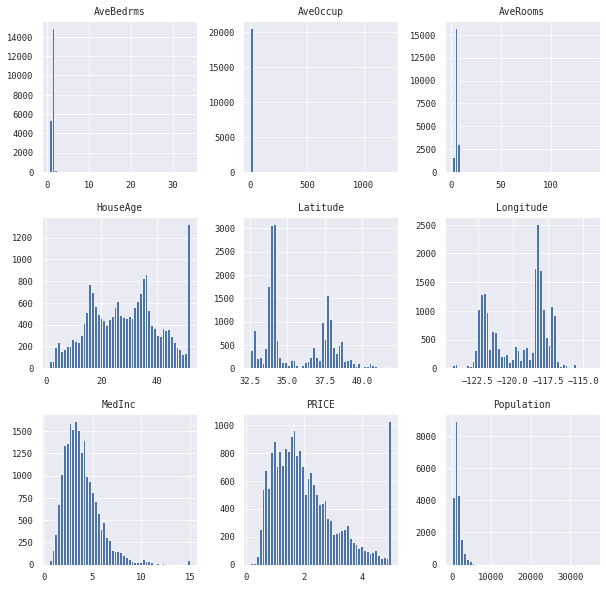

In [53]:
# we first examine the variable using a histogram.
# this is an important part of exploring the dataset
data_housing.hist(figsize=(10,10),bins=50);

##### Note that the median_income  and house prices present highly skewed data.

In [54]:
# to examine how different variables affect house prices and to understand their potential quality as predictors,
# we can calculate the correlation between each pair of variables considering only binary and continuous variables
data_housing.corr()

,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,Latitude,Longitude,PRICE
MedInc,1.000000,-0.119034,0.326895,-0.062040,0.004834,0.018766,-0.079809,-0.015176,0.688075
HouseAge,-0.119034,1.000000,-0.153277,-0.077747,-0.296244,0.013191,0.011173,-0.108197,0.105623
AveRooms,0.326895,-0.153277,1.000000,0.847621,-0.072213,-0.004852,0.106389,-0.027540,0.151948
AveBedrms,-0.062040,-0.077747,0.847621,1.000000,-0.066197,-0.006181,0.069721,0.013344,-0.046701
Population,0.004834,-0.296244,-0.072213,-0.066197,1.000000,0.069863,-0.108785,0.099773,-0.024650
AveOccup,0.018766,0.013191,-0.004852,-0.006181,0.069863,1.000000,0.002366,0.002476,-0.023737
Latitude,-0.079809,0.011173,0.106389,0.069721,-0.108785,0.002366,1.000000,-0.924664,-0.144160
Longitude,-0.015176,-0.108197,-0.027540,0.013344,0.099773,0.002476,-0.924664,1.000000,-0.045967
PRICE,0.688075,0.105623,0.151948,-0.046701,-0.024650,-0.023737,-0.144160,-0.045967,1.000000


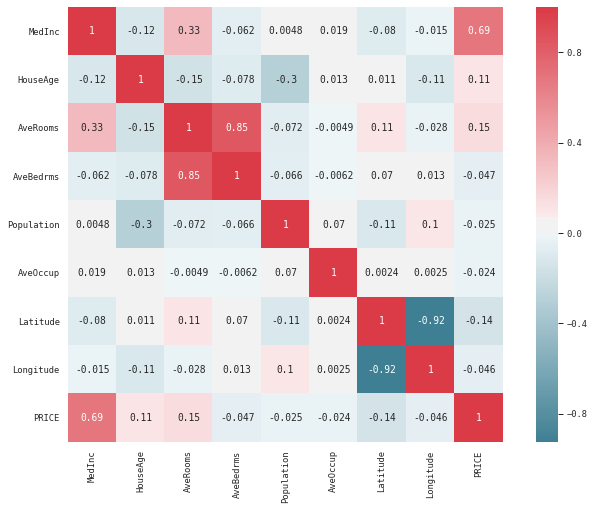

In [55]:
# a better visualisation is achieved with the package seaborn 
sns.set(context="paper",font="monospace")
housing_corr_matrix = data_housing.corr()
# set the matplotlib figure
fig, axe = plt.subplots(figsize=(12,8))
# generate color palettes 
cmap = sns.diverging_palette(220,10,center = "light", as_cmap=True)
# draw the heatmap
sns.heatmap(housing_corr_matrix,vmax=1,square =True, cmap=cmap,annot=True );

#### 3. Machine Learning Algorithms

##### To apply ML models, we have first to prepare and split the dataset into a train and testset

In [56]:
# we will adopt a 80% training + 20% testing split ratio
x = data_housing[['MedInc', 'HouseAge', 'AveRooms', 'AveBedrms', 
    'Population', 'AveOccup', 'Latitude', 'Longitude' ]]
y = data_housing['PRICE']

# divide the data into a training set (data_train,target_train) and a test set (data_test,data_train)
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = .02)

####  3. Linear Regression

In [57]:
from sklearn.linear_model import LinearRegression

In [58]:
# train the model with fit() method along with the training data.
model = LinearRegression()
model.fit(x_train, y_train)
y_pred=model.predict(x_test)

In [59]:
# we can find the  value of the intercept and slop calculated by the linear regression algorithm
# to retrieve the intercept:
print(model.intercept_)

# for retrieving the slope:
print(model.coef_)

-37.15128097395892
[ 4.35065688e-01  9.33961762e-03 -1.05108071e-01  6.34410646e-01
 -4.39416728e-06 -3.73972358e-03 -4.24379194e-01 -4.37254583e-01]


In [60]:
# calculate the R2
r2_score(y_test,y_pred)

0.6427513197915852

In [61]:
# calculate the mean square error
mean_squared_error(y_test,y_pred)

0.4504927091976541

##### Visualising the algorith fit

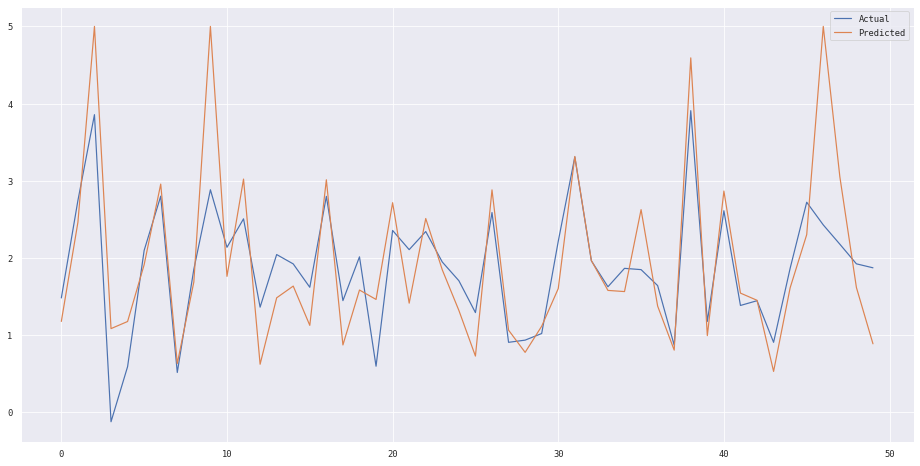

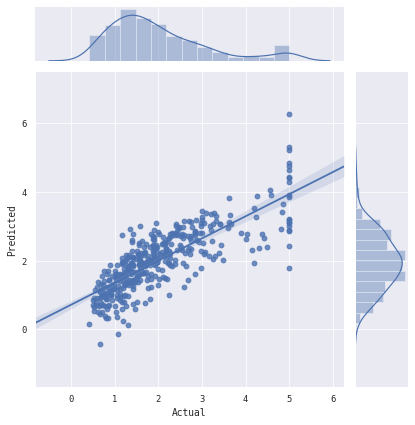

In [62]:
import seaborn as sns
test = pd.DataFrame({'Predicted':y_pred,'Actual':y_test})
fig= plt.figure(figsize=(16,8))
test = test.reset_index()
test = test.drop(['index'],axis=1)
plt.plot(test[:50])
plt.legend(['Actual','Predicted'])
sns.jointplot(x='Actual',y='Predicted',data=test,kind='reg',);

### 3.2 Random Forest Regressor

In [63]:
from sklearn.ensemble import RandomForestRegressor

In [64]:
model = RandomForestRegressor(max_depth=2, random_state=0)
model.fit(x_train, y_train)
y_pred = model.predict(x_test)

C:\Users\Laurent\Anaconda3\lib\site-packages\sklearn\ensemble\forest.py:245: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)


In [65]:
# calculate the R2
r2_score(y_test,y_pred)

0.47550953792030504

In [70]:
# calculate and print the mean square error
mean_squared_error(y_test,y_pred)

0.6613855902078314

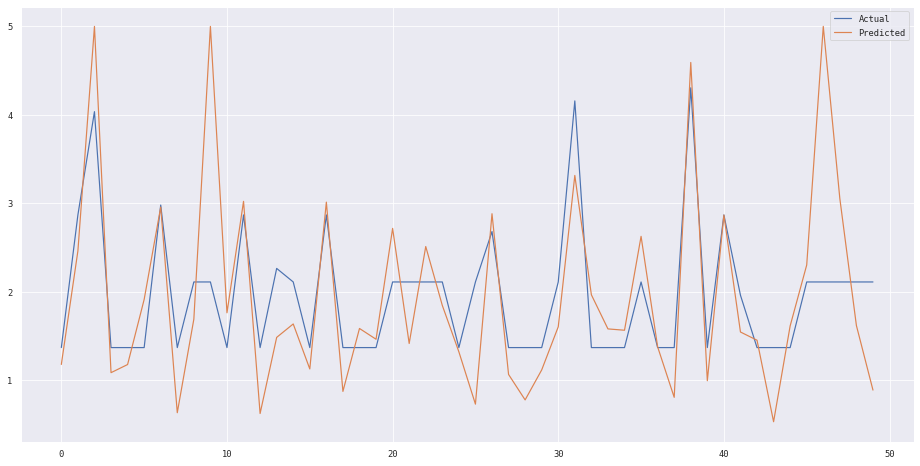

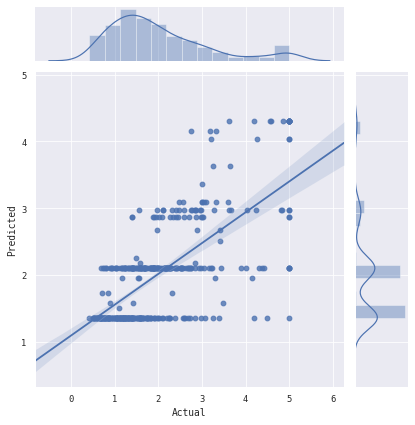

In [67]:
test = pd.DataFrame({'Predicted':y_pred,'Actual':y_test})
fig= plt.figure(figsize=(16,8))
test = test.reset_index()
test = test.drop(['index'],axis=1)
plt.plot(test[:50])
plt.legend(['Actual','Predicted'])
sns.jointplot(x='Actual',y='Predicted',data=test,kind="reg")